<table align="center" width=100%>
    <tr>
        <td width="35%">
            <img src="image.jpeg">
        </td>
        <td>
            <div align="center">
                <font color="#7F0542 ";size=100px>
                    <b>MovieLens(100K) Recommendation System
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>

## TEAM 8:
#### 1)THATHA SAI NISCHITHA
#### 2) HARSHA S
#### 3) MANISH DHRUVA MOHAN
#### 4) SHREYA JUNJAPPANAVAR
#### 5) ANN BENNY CROFT SHINY R
#### 6) BAPAN BAIRAGYA

# Problem Statement 🎥🍿

Recommender systems are one of the most successful and widespread application of machine learning technologies in business. You can find large scale recommender systems in retail, video on demand, or music streaming.

Our objective is to recommend movies to users based on their previous watch or based on user interest.

# Data Dictionary

### This data set consists of:

 * 100,000 ratings (0.5-5.0) from 671 users on  9066 movies.

 * Each user has rated at least 20 movies.

**Movies:** 

**1 - movieId** : Unique id for each movie.

**2 - title** : Name of the movie.

**3 - genres** : list of genres of movie(Type-ex:Comedy)

**Ratings:**

**4 - userId** : Unique id for each user.

**5 - movieId** : Unique id for each movie.

**6 - ratings** : Values which are rated by the user for each movie (0.5-5.0)

## Table of Contents

1. **[Import Libraries](#import_lib)**
2. **[Set Options](#set_options)**
3. **[Read Data](#Read_Data)**
    - 3.1 -[Movies](#mov)
    - 3.2 -[Ratings](#rat)
4. **[Exploratory Data Analysis](#data_preparation)**
    - 4.1 - [Preparing the Dataset](#Data_Preparing)
        - 4.1.1 - [Merging datasets](#merging)
        - 4.1.2 - [Data  Info](#info)
        - 4.1.3 - [Data Dimension](#Data_Shape)
        - 4.1.4 - [Data Types](#Data_Types)
        - 4.1.5 - [Missing Values](#Missing_Values)
    - 4.2 - [Understanding the Dataset](#Data_Understanding)
        - 4.2.1 - [Summary Statistics](#Summary_Statistics)
        - 4.2.2 - [Correlation](#correlation)
        - 4.2.3 - [Analyze Features](#analyze_fea)
5. **[Dimensionality Reduction](#dim_red)**
    - 5.1 - [PCA(Prinicipal Component analysis)](#pca)
6. **[K-Means Clustering](#kmean)**
7. **[Recommendations systems](#rec_sys)**
    - 7.1 - [Content Based](#content)
    - 7.2 - [Collaborative Based](#collab)
        - 7.2.1 - [Memory Based](#memory)
            - 7.2.1.1 - [Using KNN](#knn)
            - 7.2.1.2 - [Using SVD](#svd)
        - 7.2.2 - [Model Based](#model)
        
   - 7.3 - [Hybrid Based](#hybrid)
   - 7.4 - [Popularity Based](#pop)
   - 7.5 - [Association Analysis](#Asso)
8. **[Conclusion](#conclu)**
9. **[References](#Refer)**

# 1. Import Libraries <a id='import_lib'></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ast import literal_eval
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity, linear_kernel
from surprise import Reader, SVD, Dataset
from surprise.model_selection import cross_validate
from sklearn.neighbors import NearestNeighbors
from mlxtend.frequent_patterns import apriori,association_rules
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plusmodules as pm
from kneed import KneeLocator
from sklearn.decomposition import TruncatedSVD

# 2. Set Options <a id='set_options'></a>

In [2]:
from warnings import filterwarnings
filterwarnings('ignore')
# display all columns of the dataframe
pd.options.display.max_columns = None
# display all rows of the dataframe
pd.options.display.max_rows = None
# return an output value upto 6 decimals
pd.options.display.float_format = '{:.6f}'.format

# 3. Read Data <a id='Read_Data'></a>

### 3.1 Movies <a id='mov'></a>

In [3]:
df_movies=pd.read_csv('movies.csv')
print(df_movies.shape)
df_movies.head()

(9125, 3)


,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [4]:
df_movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9125 entries, 0 to 9124
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   movieId  9125 non-null   int64 
 1   title    9125 non-null   object
 2   genres   9125 non-null   object
dtypes: int64(1), object(2)
memory usage: 214.0+ KB


### 3.2 Ratings <a id='rat'></a>

In [5]:
df_ratings =pd.read_csv('ratings.csv')
print(df_ratings.shape)
df_ratings.head()

(100004, 4)


,userId,movieId,rating,timestamp
0,1,31,2.500000,1260759144
1,1,1029,3.000000,1260759179
2,1,1061,3.000000,1260759182
3,1,1129,2.000000,1260759185
4,1,1172,4.000000,1260759205


In [6]:
df_ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100004 entries, 0 to 100003
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   userId     100004 non-null  int64  
 1   movieId    100004 non-null  int64  
 2   rating     100004 non-null  float64
 3   timestamp  100004 non-null  int64  
dtypes: float64(1), int64(3)
memory usage: 3.1 MB


# 4. Exploratory Data Analysis <a id='data_preparation'></a>

## 4.1 Preparing the Dataset <a id='Data_Preparing'></a>

In [7]:
genres_df = pd.DataFrame(df_movies.genres.str.split('|').tolist()).stack().unique()
genres_df = pd.DataFrame(genres_df, columns = ['genres'])
df_movies = df_movies.join(df_movies.genres.str.get_dummies())

#Using regular expressions to find a year stored between parentheses
#We specify the parantheses so we don't conflict with movies that have years in their titles
df_movies['year'] = df_movies.title.str.extract('(\(\d\d\d\d\))',expand=False)
#Removing the parentheses
df_movies['year'] = df_movies.year.str.extract('(\d\d\d\d)',expand=False)
#Removing the years from the 'title' column
df_movies['title'] = df_movies.title.str.replace('(\(\d\d\d\d\))', '')
#Applying the strip function to get rid of any ending whitespace characters that may have appeared
df_movies['title'] = df_movies['title'].apply(lambda x: x.strip())

#Every genre is separated by a | so we simply have to call the split function on |
df_movies['genres'] = df_movies.genres.str.replace('|',',')

df_movies.head()

,movieId,title,genres,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year
0,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995
1,2,Jumanji,"Adventure,Children,Fantasy",0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995
2,3,Grumpier Old Men,"Comedy,Romance",0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1995
3,4,Waiting to Exhale,"Comedy,Drama,Romance",0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1995
4,5,Father of the Bride Part II,Comedy,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1995


### 4.1.1 Merge all above dataframes <a id='merging'></a>

In [8]:
data = pd.merge(df_movies, df_ratings, on="movieId")
##Removing unwanted feature (timestamp) from ratings dataset
data.drop('timestamp',axis=1,inplace=True)
data.head()

,movieId,title,genres,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year,userId,rating
0,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,7,3.000000
1,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,9,4.000000
2,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,13,5.000000
3,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,15,2.000000
4,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,19,3.000000


### 4.1.2 Data Info <a id='info'></a>

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100004 entries, 0 to 100003
Data columns (total 26 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   movieId             100004 non-null  int64  
 1   title               100004 non-null  object 
 2   genres              100004 non-null  object 
 3   (no genres listed)  100004 non-null  int64  
 4   Action              100004 non-null  int64  
 5   Adventure           100004 non-null  int64  
 6   Animation           100004 non-null  int64  
 7   Children            100004 non-null  int64  
 8   Comedy              100004 non-null  int64  
 9   Crime               100004 non-null  int64  
 10  Documentary         100004 non-null  int64  
 11  Drama               100004 non-null  int64  
 12  Fantasy             100004 non-null  int64  
 13  Film-Noir           100004 non-null  int64  
 14  Horror              100004 non-null  int64  
 15  IMAX                100004 non-nul

### 4.1.3 Data Dimensions <a id='Data_Shape'></a>

In [10]:
data.shape

(100004, 26)

In this dataset we have 100004 records across 26 features

### 4.1.4 Data Types <a id='Data_Types'></a>

In [11]:
data.dtypes

movieId                 int64
title                  object
genres                 object
(no genres listed)      int64
Action                  int64
Adventure               int64
Animation               int64
Children                int64
Comedy                  int64
Crime                   int64
Documentary             int64
Drama                   int64
Fantasy                 int64
Film-Noir               int64
Horror                  int64
IMAX                    int64
Musical                 int64
Mystery                 int64
Romance                 int64
Sci-Fi                  int64
Thriller                int64
War                     int64
Western                 int64
year                   object
userId                  int64
rating                float64
dtype: object

In this dataset we have **1 float , 3 object and 22 int columns**

### 4.1.5 Missing Values <a id='Missing_Values'></a>

In [12]:
missing_value = pd.DataFrame({
    'Missing Value': data.isnull().sum(),
    'Percentage': (data.isnull().sum() / len(data))*100
})

In [13]:
missing_value.sort_values(by='Percentage', ascending=False)

,Missing Value,Percentage
year,7,0.007000
movieId,0,0.000000
title,0,0.000000
userId,0,0.000000
Western,0,0.000000
War,0,0.000000
Thriller,0,0.000000
Sci-Fi,0,0.000000
Romance,0,0.000000
Mystery,0,0.000000


We have only **1 column with very few missing values(7)** in the dataset

**Handling Missing Values**

Since,there are very few missing values present in the data, we are dropping the null values.

In [14]:
data.dropna(inplace=True)

**Upon dropping the null values the index range differs thus the indexes need to be reset**

In [15]:
data['year']=data['year'].astype('int64')

In [16]:
data.reset_index(inplace=True,drop=True)

**Visualising missing values using Heatmap**

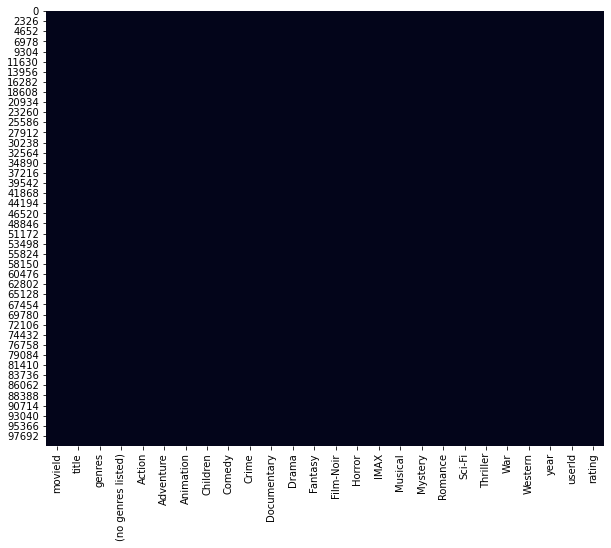

In [17]:
# set the figure size
plt.figure(figsize=(10,8))

# plot heatmap to check null values
# isnull(): returns 'True' for a missing value
# cbar: specifies whether to draw a colorbar; draws the colorbar for 'True' 
sns.heatmap(data.isnull(), cbar=False)

# display the plot
plt.show()

Now, There are **No missing values** present in the dataset

## 4.2 Understanding the Dataset <a id='Data_Understanding'></a>

### 4.2.1 Summary Statistics <a id='Summary_Statistics'></a>

**Numeric Variables**

In [18]:
data.describe(include=np.number)

,movieId,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year,userId,rating
count,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000
mean,12540.628629,0.000160,0.270568,0.220177,0.061702,0.086803,0.380231,0.162665,0.015640,0.447523,0.106573,0.011400,0.067902,0.031561,0.047221,0.076252,0.193366,0.153655,0.252408,0.050252,0.019121,1991.827305,347.010960,3.543591
std,26351.966194,0.012648,0.444256,0.414368,0.240614,0.281547,0.485446,0.369061,0.124081,0.497241,0.308571,0.106163,0.251579,0.174829,0.212113,0.265403,0.394939,0.360619,0.434396,0.218465,0.136949,15.088703,195.161654,1.058055
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1902.000000,1.000000,0.500000
25%,1028.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1987.000000,182.000000,3.000000
50%,2406.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1995.000000,367.000000,4.000000
75%,5418.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2001.000000,520.000000,4.000000
max,163949.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2016.000000,671.000000,5.000000


From the above table , we can infer:

    1.  There are 99997 values present in the dataset
    
    2.  The maximum value for rating is 5 and where as the minimum value is 0.5 and the average rating is 3.5

**Categorical Variables**

In [19]:
data.describe(include = object)

,title,genres
count,99997,99997
unique,8831,901
top,Forrest Gump,Drama
freq,341,7756


From the above table, we can infer:

    1. The movie Forest Grump has been rated the most among all the movies with frequency of 341.
    
    2. Out of all geres the Drama genre movie has been watched and rated most with the frequency 7756.

### 4.2.2 Correlation <a id='correlation'></a>

In [20]:
corr_matrix=data.corr()
corr_matrix

,movieId,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year,userId,rating
movieId,1.000000,0.056710,0.071485,0.033675,0.050633,-0.021167,-0.043538,-0.000262,0.074519,0.008140,0.023108,-0.020757,-0.013166,0.274526,-0.043957,0.012023,-0.057753,0.070595,0.011840,-0.019379,-0.016267,0.431937,0.007118,-0.028987
(no genres listed),0.056710,1.000000,-0.007705,-0.006722,-0.003244,-0.003900,-0.009909,-0.005576,-0.001595,-0.011386,-0.004369,-0.001358,-0.003414,-0.002284,-0.002816,-0.003635,-0.006194,-0.005390,-0.007351,-0.002910,-0.001766,0.012930,0.002706,0.003589
Action,0.071485,-0.007705,1.000000,0.334093,-0.093405,-0.139640,-0.228864,0.100697,-0.073323,-0.246191,-0.024325,-0.047167,-0.032494,0.129798,-0.120942,-0.046995,-0.173141,0.330443,0.275469,0.061143,0.027725,0.131404,-0.030673,-0.056399
Adventure,0.033675,-0.006722,0.334093,1.000000,0.237466,0.236318,-0.063912,-0.171552,-0.062505,-0.266712,0.251967,-0.045239,-0.104276,0.166774,0.017673,-0.087555,-0.146742,0.251299,-0.035682,-0.050086,0.045470,0.042065,-0.024060,-0.011650
Animation,0.050633,-0.003244,-0.093405,0.237466,1.000000,0.657119,0.087668,-0.079016,-0.030314,-0.142029,0.248296,-0.026755,-0.060127,0.107993,0.340282,-0.048620,-0.014845,-0.030202,-0.142498,-0.051186,-0.028520,0.013410,-0.009853,0.022412
Children,-0.021167,-0.003900,-0.139640,0.236318,0.657119,1.000000,0.106357,-0.111924,-0.036859,-0.151688,0.327135,-0.033108,-0.082084,0.082496,0.329907,-0.061010,-0.044556,-0.061336,-0.177836,-0.067666,-0.032930,-0.055586,0.001100,-0.022555
Comedy,-0.043538,-0.009909,-0.228864,-0.063912,0.087668,0.106357,1.000000,-0.086956,-0.071006,-0.272802,0.069756,-0.079843,-0.107578,-0.109703,0.050653,-0.167989,0.190901,-0.171447,-0.322622,-0.076348,-0.025572,0.043542,0.022609,-0.072252
Crime,-0.000262,-0.005576,0.100697,-0.171552,-0.079016,-0.111924,-0.086956,1.000000,-0.053156,0.061665,-0.114204,0.151756,-0.043567,-0.014936,-0.089308,0.136880,-0.165782,-0.131746,0.294384,-0.079926,-0.049864,0.049896,-0.005863,0.056674
Documentary,0.074519,-0.001595,-0.073323,-0.062505,-0.030314,-0.036859,-0.071006,-0.053156,1.000000,-0.096754,-0.042752,-0.013536,-0.031459,-0.010770,0.001575,-0.034697,-0.061716,-0.053262,-0.072686,-0.011655,-0.017599,0.055301,0.021724,0.032132
Drama,0.008140,-0.011386,-0.246191,-0.266712,-0.142029,-0.151688,-0.272802,0.061665,-0.096754,1.000000,-0.154877,-0.011400,-0.135077,-0.059748,-0.073881,0.001867,0.104429,-0.202958,-0.073683,0.177693,-0.007294,-0.018087,0.009458,0.117533


Visualizing the correlation matrix with heatmap

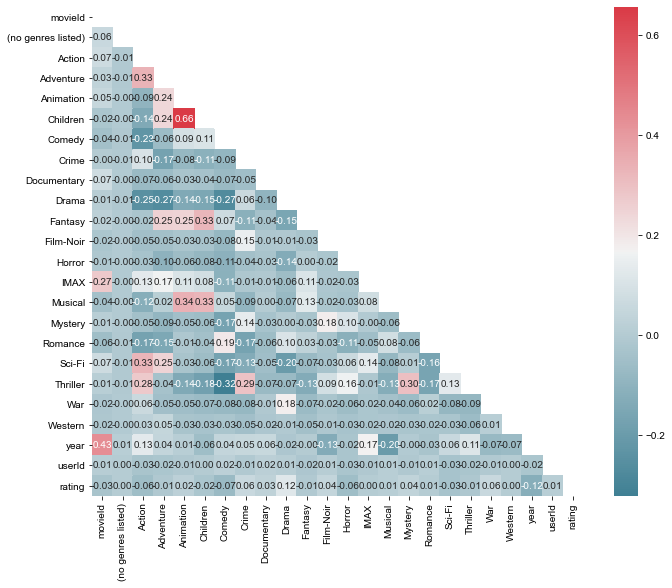

In [21]:
plt.figure(figsize=(11,9))
dropSelf = np.zeros_like(corr_matrix)
dropSelf[np.triu_indices_from(dropSelf)] = True

sns.heatmap(corr_matrix, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)

sns.set(font_scale=1.5)

**Inferences:**
1. Animation and Children are bit highly correlated in the data (0.66)
    
2. Action and Adventure,Fantasy and children,Scifi and Action are bit moderately correlated.

### 4.2.3 Analyse Features <a id='analyze_fea'></a>

#### Average User Ratings

In [22]:
user_ratings =data[['userId','rating']].groupby('userId').mean()

Text(0, 0.5, 'Frequency')

<Figure size 576x576 with 0 Axes>

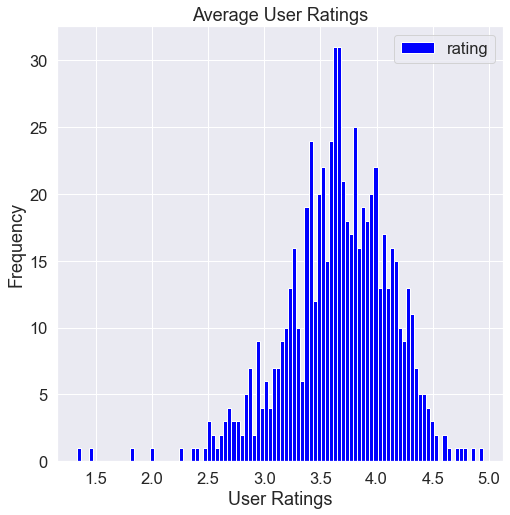

In [23]:
fig = plt.figure(figsize = (8,8))
user_ratings.plot(kind = 'hist', bins = 100, figsize = (8,8), color = 'blue')
plt.plot()
plt.xlabel('User Ratings')
plt.title('Average User Ratings')
plt.ylabel('Frequency')

From above plot, we can see that on average, user are rating movies 3-4 more frequently than any other rating. 
This makes sense since people are less inclined to rate movies lower than a 3 if they didn't enjoy the movie. 
Additionally, we can see the cause of the right-skewed distribution for the average movie ratings per genre.

#### No.of movies released in each year.

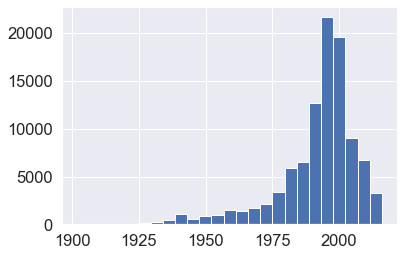

In [24]:
plt.hist(data['year'], bins=25)
plt.show()

From the above plot we can infer most of the movies present in the dataset were released from year 2000.

#### Number  of movies per each genre

In [25]:
### considering only the genre columns for the test
test = df_movies.iloc[:,3:22].sum()
test=test.iloc[1:]
print(test)

Action         1545
Adventure      1117
Animation       447
Children        583
Comedy         3315
Crime          1100
Documentary     495
Drama          4365
Fantasy         654
Film-Noir       133
Horror          877
IMAX            153
Musical         394
Mystery         543
Romance        1545
Sci-Fi          792
Thriller       1729
War             367
dtype: int64


In [26]:
print(type(pd.to_numeric(test)))
print(type(test.to_numpy().reshape(18,)[0]))
# genre_sum = np.hstack((np.asarray(genre_list).reshape(18,1), test.to_numpy().reshape(18,)))
# genre_sum[:,1] = genre_sum[:,1].astype('int64')
test2 = test.to_numpy().reshape(18,)

<class 'pandas.core.series.Series'>
<class 'numpy.int64'>


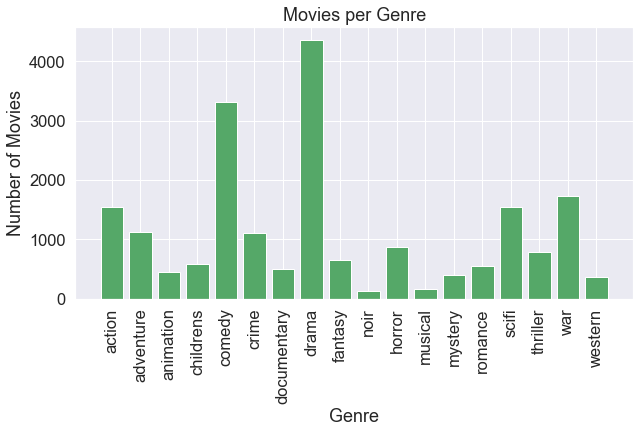

In [27]:
genre_list=['action', 'adventure','animation', 'childrens', 'comedy', 'crime', 'documentary', 'drama','fantasy', 'noir', 'horror', 'musical', 'mystery', 'romance', 'scifi','thriller', 'war', 'western']
x = np.arange(18)
plt.figure(figsize = (10,5))
plt.bar(x, test2, color = 'g')
plt.xticks(x, genre_list, rotation = 'vertical')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.title('Movies per Genre')
sns.set(font_scale=1.5)
plt.show()

From the above plot,Most of the movies are from Drama genre next to that is Comedy.

Documentary,Film-noir,musical genres have least no.of movies.

#### Num of ratings for each rating

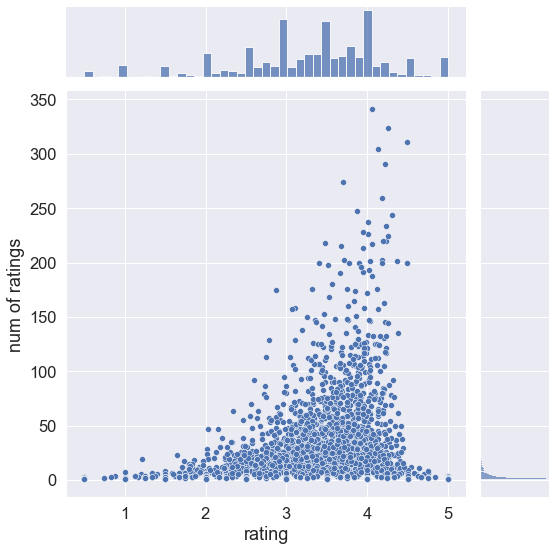

In [28]:
ratings = pd.DataFrame(data.groupby('title')['rating'].mean())
ratings['num of ratings'] = pd.DataFrame(data.groupby('title')['rating'].count())
sns.jointplot(x='rating',y='num of ratings',data=ratings,alpha=1.0,height = 8)

From the above plot, we can see the users are rating mostly 3's and 4's for the movies.

#### Top 10 users who have rated most of the movies

In [29]:
df_ratings.drop('timestamp',axis=1,inplace=True)
##Calculating the average rating for each user id
ratings_grouped_by_users = df_ratings.groupby('userId').agg([np.size, np.mean])
ratings_grouped_by_users = ratings_grouped_by_users.drop('movieId', axis = 1)
ratings_grouped_by_users.head()

rating         
             size     mean
userId                    
1       20.000000 2.550000
2       76.000000 3.486842
3       51.000000 3.568627
4      204.000000 4.348039
5      100.000000 3.910000

<AxesSubplot:xlabel='userId'>

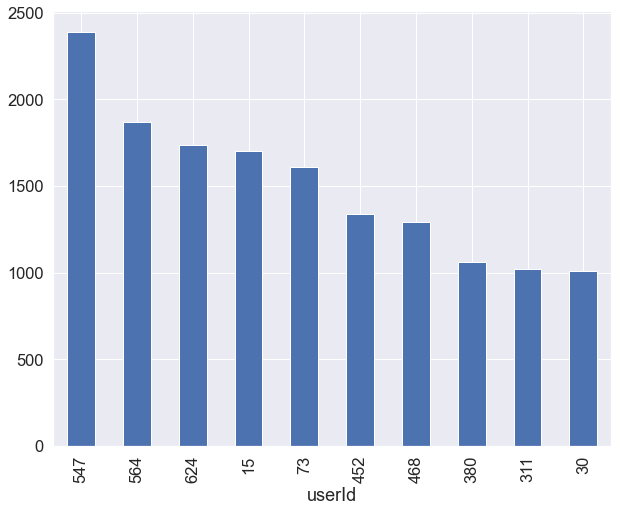

In [30]:
ratings_grouped_by_users['rating']['size'].sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,8))

The above plot shows the top 10 users who have rated most of the movies .The User 547 have rated most of the movies.

#### Movies with high average rating

In [31]:
##Average rating for each movie
ratings_grouped_by_movies = df_ratings.groupby('movieId').agg([np.mean], np.size)
print(ratings_grouped_by_movies.shape)
ratings_grouped_by_movies = ratings_grouped_by_movies.drop('userId', axis=1)
ratings_grouped_by_movies.head()

(9066, 2)


,rating
,mean
movieId,
1,3.872470
2,3.401869
3,3.161017
4,2.384615
5,3.267857


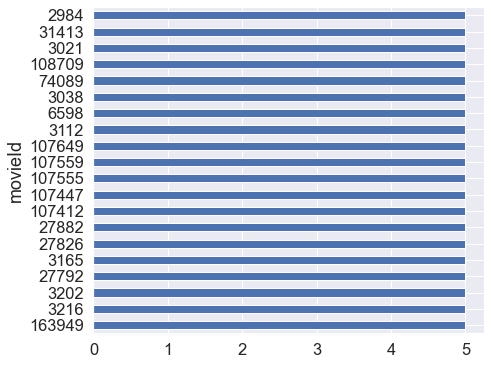

In [32]:
#top20 highest rated movies
ratings_grouped_by_movies['rating']['mean'].sort_values(ascending=False).head(20).plot(kind='barh', figsize=(7,6));

The above plot shows top 20 movies with high average rating.

#### Movies with low average rating

In [33]:
### movies having the average rating less than 1.5
low_rated_movies_filter = ratings_grouped_by_movies['rating']['mean']< 1.5
low_rated_movies = ratings_grouped_by_movies[low_rated_movies_filter]
low_rated_movies.head()

,rating
,mean
movieId,
96,1.000000
137,1.000000
439,1.000000
473,1.000000
526,1.000000


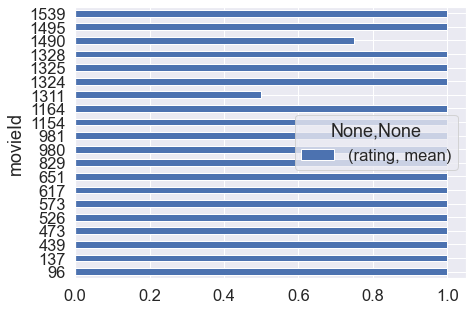

In [34]:
low_rated_movies.head(20).plot(kind='barh', figsize=(7,5));

The above plot shows bottom 20 low rated movies.

#### Average Movie Ratings by Genre

In [35]:
df = data[['movieId', 'rating']].groupby('movieId').mean()

In [36]:
df.head()

,rating
movieId,
1,3.872470
2,3.401869
3,3.161017
4,2.384615
5,3.267857


In [37]:
genres_df.count()

genres    20
dtype: int64

In [38]:
data1=data.copy()
data1.drop('genres', inplace = True, axis=1)

In [39]:
data1.head()

,movieId,title,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year,userId,rating
0,1,Toy Story,0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,7,3.000000
1,1,Toy Story,0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,9,4.000000
2,1,Toy Story,0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,13,5.000000
3,1,Toy Story,0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,15,2.000000
4,1,Toy Story,0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,19,3.000000


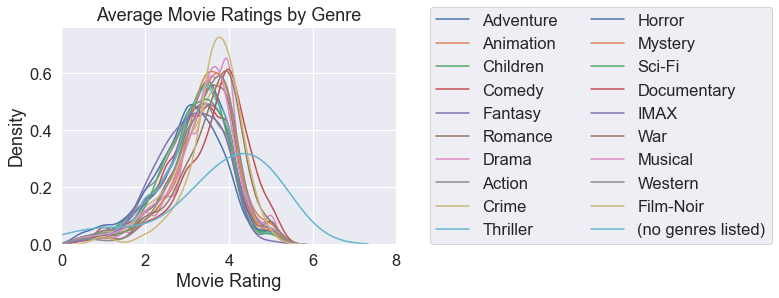

<Figure size 1440x1440 with 0 Axes>

In [40]:
for genres in genres_df.genres:
    df = data1[data1[genres] == True]
    df = data1[data1.set_index('movieId').index.isin(df.set_index('movieId').index)]
    df = df[['movieId', 'rating']].groupby('movieId').mean()
    sns.distplot(df.rating, hist = False, kde = True, label = genres)
plt.legend(loc = (1.10,0), ncol = 2)
plt.xlim(0,8)
plt.xlabel('Movie Rating')
plt.ylabel('Density')
plt.title('Average Movie Ratings by Genre')
plt.figure(figsize=(20,20))
plt.show()

We used a density distribution plot in order to get the distribution of the average movie rating per genre. 
From above, we can see that people are rarely ratings movies lower than a 3 star, which contributes to a right-skewed distributiion.The Thriller is bit normally distributed.

#### Stdev Movie Ratings by Genre

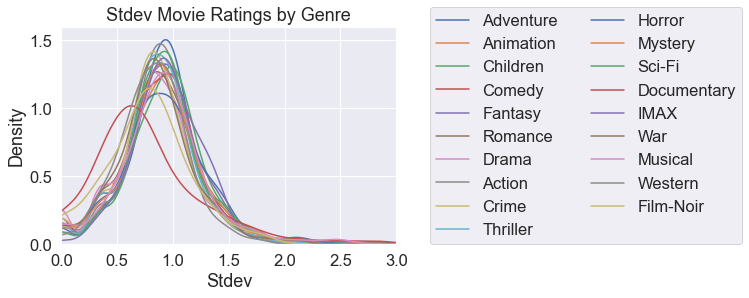

<Figure size 1440x1440 with 0 Axes>

In [41]:
for genres in genres_df.genres:
    df2 = df_movies[df_movies[genres] == True]
    df2 = df_ratings[df_ratings.set_index('movieId').index.isin(df2.set_index('movieId').index)]
    df2 = df2[['movieId', 'rating']].groupby('movieId').std()
    sns.distplot(df2.rating, hist = False, kde = True, label = genres)
plt.legend(loc = (1.10,0), ncol = 2)
plt.xlim(0,3)
plt.ylim(0,1.6)
plt.xlabel('Stdev')
plt.ylabel('Density')
plt.title('Stdev Movie Ratings by Genre')
plt.figure(figsize=(20,20))
plt.show()

From above, we can see that the standard deviation of all of the different genres are around the same at approx. 
1 with density of 1.5. However, there are two notable outliers, 
For comedy, we see that the stdev is approx. 1 with a density greater than 3. This means that people either typically really likes the comedy movie or they dont. This makes sense in real life as well since everyone's tase in comedy is different despite all of the movies being categorized under one branch.

## 5.Dimensionality Reduction <a id='dim_red'></a>

### 5.1 PCA(Principal component analysis) <a id='pca'></a>

In [42]:
df_movies.head()

,movieId,title,genres,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year
0,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995
1,2,Jumanji,"Adventure,Children,Fantasy",0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995
2,3,Grumpier Old Men,"Comedy,Romance",0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1995
3,4,Waiting to Exhale,"Comedy,Drama,Romance",0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1995
4,5,Father of the Bride Part II,Comedy,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1995


In [43]:
###Considering the genres and movie title
title_genre=df_movies.iloc[:,1:23]

In [44]:
title_genre.drop('genres',axis=1,inplace=True)
title_genre.set_index('title',inplace=True)

In [45]:
print(title_genre.shape)
title_genre.head()

(9125, 20)


,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
title,,,,,,,,,,,,,,,,,,,,
Toy Story,0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
Jumanji,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
Grumpier Old Men,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
Waiting to Exhale,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0
Father of the Bride Part II,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [46]:
pca = PCA(n_components=20)
pca.fit(title_genre)
pca_samples = pca.transform(title_genre)

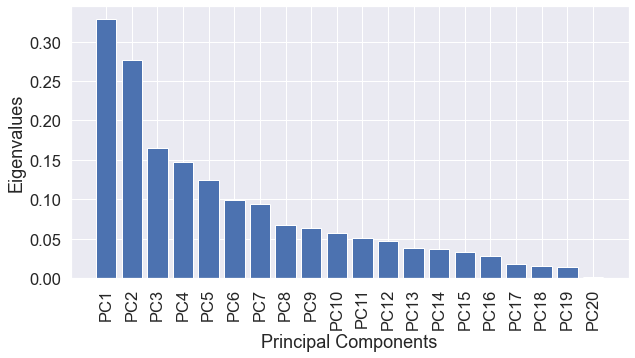

In [47]:
pcs = ['PC'+str(i) for i in range(1,21)]
pca.explained_variance_
plt.figure(figsize=(10, 5))
plt.bar(pcs, pca.explained_variance_)
plt.ylabel('Eigenvalues')
plt.xlabel('Principal Components')
plt.xticks(rotation=90)
plt.show()

From the plot,we can see first few principal components holds most the variance.

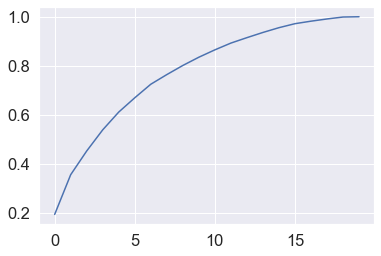

In [48]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.show()

From,the above cummulative explained variance we can see from prinicipal component 15 the variance is almost one.

Hence we consider 15 components.

In [49]:
pca = PCA(n_components=15)
pca.fit(title_genre)
pca_samples = pca.transform(title_genre)

Below is the variation that holds by each component.

In [50]:
np.cumsum(pca.explained_variance_ratio_)

array([0.19242558, 0.35468468, 0.45159213, 0.53796534, 0.61058101,
       0.66888967, 0.72424669, 0.76363484, 0.80092664, 0.83464243,
       0.86472257, 0.89237567, 0.91456549, 0.93580759, 0.95530555])

In [51]:
dfx = pd.DataFrame(pca_samples)
#the dataframe of pca samples
dfx.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,1.099843,0.201500,0.886446,0.121963,-0.268501,1.292049,-0.284779,0.093955,-0.161859,0.246900,0.008561,-0.113325,-0.324428,-0.056767,0.195226
1,0.366446,0.504094,0.981070,-0.267087,0.001914,0.897447,-0.462933,0.066602,-0.209950,-0.036667,0.256526,-0.232545,-0.159249,0.054057,-0.185477
2,0.825875,-0.501837,-0.217934,0.184971,0.623633,-0.135462,-0.120347,-0.042172,0.023607,-0.048317,-0.016832,0.009537,-0.086774,0.016872,-0.078919
3,0.151593,-1.007596,-0.094704,0.458356,0.430442,0.012175,0.144882,0.012670,0.000991,-0.030364,-0.022461,-0.013895,-0.061525,-0.115246,0.131886
4,0.771894,-0.167585,-0.223766,-0.091250,-0.239706,-0.089711,0.089385,-0.101958,0.011593,-0.033360,0.041003,-0.001797,-0.021880,0.044392,-0.146642


### 6. K-Means Clustering <a id='kmean'></a>

In [52]:
ssd = []
sscore = []
for k in range(2,10):
    kmeans = KMeans(n_clusters=k, random_state=4)
    kmeans.fit(dfx)
    ssd.append(kmeans.inertia_)
    #ss = silhouette_score(dfx, kmeans.labels_)
    #sscore.append(ss)

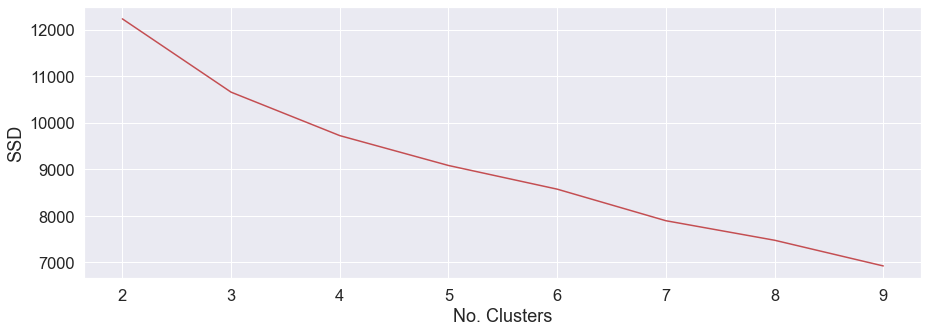

In [53]:
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(range(2,10), ssd, 'r')
ax.set_xlabel('No. Clusters')
ax.set_ylabel('SSD')
plt.show()

From the above plot, we can see that the SSD is decreasing as the number of clusters increases.

From the elbow plot we cannot decide arbitrarly how many no.of clusters to be considered.Hence we used KneeLocator to find the elbow for the curve.

In [54]:
kl = KneeLocator(range(2,10), ssd, curve="convex", direction="decreasing")
kl.elbow

4

In [55]:
new_clusters = KMeans(n_clusters = 4, random_state = 4)
# fit the model with no.of clusters obtained from above
new_clusters.fit(title_genre)
# append the cluster label for each point in the dataframe 'title_genre'
title_genre['Cluster'] = new_clusters.labels_

In [56]:
a=title_genre['Cluster'].value_counts() #No.of clusters formed in the data 
a

0    3178
2    2665
3    1687
1    1595
Name: Cluster, dtype: int64

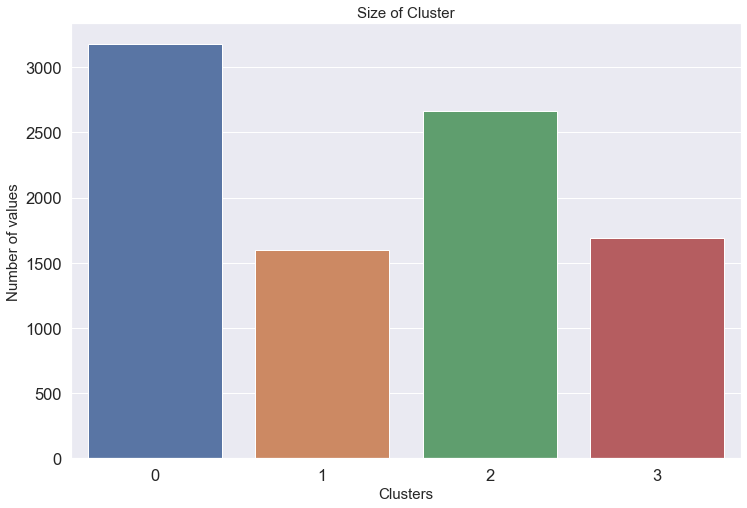

In [57]:
plt.figure(figsize=(12,8))
sns.countplot(data=title_genre,x='Cluster')
# set the axes and plot labels
# set the font size using 'fontsize'
plt.title('Size of Cluster', fontsize = 15)
plt.xlabel('Clusters', fontsize = 15)
plt.ylabel('Number of values', fontsize = 15)
plt.show()

Describing the cluster 0

In [58]:
Cluster0 = title_genre[title_genre['Cluster']==0].drop('Cluster',axis=1).mean()

In [59]:
Cluster0.sort_values(ascending=False)[0:15]

Comedy      1.000000
Drama       0.285400
Romance     0.257080
Adventure   0.097546
Children    0.093140
Action      0.088420
Fantasy     0.073317
Crime       0.070799
Musical     0.059157
Animation   0.059157
Sci-Fi      0.040906
Horror      0.034613
Mystery     0.016362
War         0.014160
Western     0.013216
dtype: float64

The above data explains that in the Cluster0 most of the movies present belongs to the comedy genre next to that is genre Drama. 

In [60]:
Cluster1 = title_genre[title_genre['Cluster']==1].drop('Cluster',axis=1).mean()

In [61]:
Cluster1.sort_values(ascending=False)[0:15]

Action        0.275235
Documentary   0.271473
Adventure     0.260188
Horror        0.198119
Sci-Fi        0.189342
Fantasy       0.151724
Children      0.129781
Animation     0.126019
Musical       0.072727
Crime         0.054545
Romance       0.052665
IMAX          0.047022
Western       0.039498
Mystery       0.033856
War           0.031348
dtype: float64

Similarly,In the Cluster1 most of the movies present in that cluster belongs to action genre next to that is genre documentary.

In [62]:
def cluster_plot(data, nclusters):
    import matplotlib.pyplot as plt
    from sklearn.cluster import KMeans
    X = data.copy()
    km = KMeans(n_clusters=nclusters, init='random', n_init=10, max_iter=300, tol=1e-04, random_state=0)
    y_km = km.fit_predict(X)
    # Visualize it:
    plt.figure(figsize=(8, 6))
    plt.scatter(X.iloc[:,0], X.iloc[:,1], c=km.labels_.astype(float))
    # plot the centroids
    plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], s=250, marker='*', c='red', label='centroids')
    plt.legend(scatterpoints=1)
    plt.grid()
    plt.show()

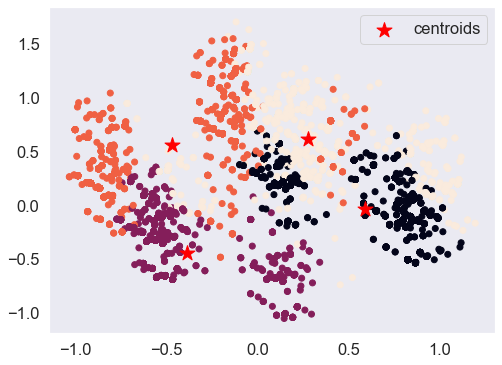

In [63]:
cluster_plot(dfx, 4)

The above plot shows the 4 different types of clusters that are formed and 4 different centroids.

## 7. Recommendation Systems <a id='rec_sys'></a>

#### Merging the dataframes

In [64]:
movie_rating = pd.merge(df_movies,df_ratings, how='left', on='movieId')

In [65]:
movie_rating.isnull().sum()

movieId                0
title                  0
genres                 0
(no genres listed)     0
Action                 0
Adventure              0
Animation              0
Children               0
Comedy                 0
Crime                  0
Documentary            0
Drama                  0
Fantasy                0
Film-Noir              0
Horror                 0
IMAX                   0
Musical                0
Mystery                0
Romance                0
Sci-Fi                 0
Thriller               0
War                    0
Western                0
year                   8
userId                59
rating                59
dtype: int64

In [66]:
movie_rating.dropna(inplace=True)

In [67]:
movie_rating.reset_index(inplace=True,drop=True)

In [68]:
movie_rating['userId']=movie_rating['userId'].astype('int64')

In [69]:
movie_rating.tail()

,movieId,title,genres,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year,userId,rating
99992,161918,Sharknado 4: The 4th Awakens,"Action,Adventure,Horror,Sci-Fi",0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,2016,624,1.500000
99993,161944,The Last Brickmaker in America,Drama,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2001,287,5.000000
99994,162542,Rustom,"Romance,Thriller",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,2016,611,5.000000
99995,162672,Mohenjo Daro,"Adventure,Drama,Romance",0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,2016,611,3.000000
99996,163949,The Beatles: Eight Days a Week - The Touring Y...,Documentary,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2016,547,5.000000


### 7.1 Content based <a id='content'></a>

Content-based filtering uses item features to recommend other items similar to what the user likes, based on their previous actions or explicit feedback.
Here we have considered the content genres of the movies.

In [70]:
df=movie_rating.copy()
#  dropping the duplicates that are present in the data based on movie title and genres
df.drop_duplicates(subset=['title','genres'],inplace=True) 

In [71]:
df.reset_index(inplace=True,drop=True) #upon dropping the values reseting the index

In [72]:
df.shape # the shape of the dataset after dropping the duplicates

(9027, 26)

In [73]:
df.head() #Final dataset

,movieId,title,genres,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year,userId,rating
0,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,7,3.000000
1,2,Jumanji,"Adventure,Children,Fantasy",0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,15,2.000000
2,3,Grumpier Old Men,"Comedy,Romance",0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1995,5,4.000000
3,4,Waiting to Exhale,"Comedy,Drama,Romance",0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1995,19,3.000000
4,5,Father of the Bride Part II,Comedy,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1995,15,4.500000


In [74]:
#TFidf vectorizer has been used considering the genres column as content
#this nlp technique removes all unwanted english words like 'a' and 'the'
tf = TfidfVectorizer(ngram_range=(1,2), stop_words='english')
tfidf_matrix = tf.fit_transform(df['genres'])
tfidf_matrix.shape

(9027, 178)

In [75]:
##Calculating the similarity between values from the matrix obtained above using linear kernel
simil = linear_kernel(tfidf_matrix, tfidf_matrix)
simil.shape

(9027, 9027)

In [76]:
id=df['movieId'].values ##Assigning the movie titles to the variable id

In [77]:
#Creating the dataframe with similarity vales and movie titles as columns
simil = pd.DataFrame(simil, index=id, columns=id)
simil.columns = df['title']
simil['title'] = df['title'].values

In [78]:
simil.head(10) 

title,Toy Story,Jumanji,Grumpier Old Men,Waiting to Exhale,Father of the Bride Part II,Heat,Sabrina,Tom and Huck,Sudden Death,GoldenEye,"American President, The",Dracula: Dead and Loving It,Balto,Nixon,Cutthroat Island,Casino,Sense and Sensibility,Four Rooms,Ace Ventura: When Nature Calls,Money Train,Get Shorty,Copycat,Assassins,Powder,Leaving Las Vegas,Othello,Now and Then,Persuasion,"City of Lost Children, The (Cité des enfants perdus, La)",Shanghai Triad (Yao a yao yao dao waipo qiao),Dangerous Minds,Twelve Monkeys (a.k.a. 12 Monkeys),Babe,Carrington,Dead Man Walking,Across the Sea of Time,It Takes Two,Clueless,"Cry, the Beloved Country",Richard III,Dead Presidents,Restoration,Mortal Kombat,To Die For,How to Make an American Quilt,Seven (a.k.a. Se7en),Pocahontas,When Night Is Falling,"Usual Suspects, The",Mighty Aphrodite,Lamerica,"Big Green, The",Georgia,Home for the Holidays,"Postman, The (Postino, Il)","Confessional, The (Confessionnal, Le)","Indian in the Cupboard, The",Eye for an Eye,Mr. Holland's Opus,Don't Be a Menace to South Central While Drinking Your Juice in the Hood,Two if by Sea,Bio-Dome,Lawnmower Man 2: Beyond Cyberspace,French Twist (Gazon maudit),Friday,From Dusk Till Dawn,Fair Game,Kicking and Screaming,"Misérables, Les",Bed of Roses,Screamers,Nico Icon,"Crossing Guard, The","Juror, The","White Balloon, The (Badkonake sefid)",Things to Do in Denver When You're Dead,Antonia's Line (Antonia),Once Upon a Time... When We Were Colored,Last Summer in the Hamptons,Angels and Insects,White Squall,Dunston Checks In,Black Sheep,Nick of Time,Mary Reilly,Vampire in Brooklyn,Beautiful Girls,Broken Arrow,In the Bleak Midwinter,"Hate (Haine, La)",Shopping,Heidi Fleiss: Hollywood Madam,City Hall,Bottle Rocket,Mr. Wrong,Unforgettable,Happy Gilmore,"Bridges of Madison County, The",Muppet Treasure Island,Catwalk,Braveheart,Taxi Driver,Rumble in the Bronx (Hont faan kui),Before and After,Margaret's Museum,Anne Frank Remembered,"Young Poisoner's Handbook, The",If Lucy Fell,"Steal Big, Steal Little","Boys of St. Vincent, The",Boomerang,Chungking Express (Chung Hing sam lam),"Star Maker, The (Uomo delle stelle, L')",Flirting With Disaster,"NeverEnding Story III, The",Pie in the Sky,Angela,Frankie Starlight,Jade,Down Periscope,Man of the Year,Up Close and Personal,"Birdcage, The","Brothers McMullen, The",Bad Boys,"Amazing Panda Adventure, The","Basketball Diaries, The","Awfully Big Adventure, An",Amateur,Apollo 13,Rob Roy,"Addiction, The",Batman Forever,Beauty of the Day (Belle de jour),Beyond Rangoon,Blue in the Face,Canadian Bacon,Casper,Clockers,Congo,Crimson Tide,Crumb,Desperado,Devil in a Blue Dress,Die Hard: With a Vengeance,"Doom Generation, The",Feast of July,First Knight,Free Willy 2: The Adventure Home,Hackers,Jeffrey,Johnny Mnemonic,Judge Dredd,Jury Duty,Kids,Living in Oblivion,Lord of Illusions,Love & Human Remains,Mad Love,Mallrats,Mighty Morphin Power Rangers: The Movie,Mute Witness,Nadja,"Net, The",Nine Months,Party Girl,"Prophecy, The",Reckless,Safe,"Scarlet Letter, The",Showgirls,Smoke,Something to Talk About,Species,Strange Days,"Umbrellas of Cherbourg, The (Parapluies de Cherbourg, Les)","Tie That Binds, The",Three Wishes,Total Eclipse,"To Wong Foo, Thanks for Everything! Julie Newmar",Under Siege 2: Dark Territory,Unstrung Heroes,Unzipped,"Walk in the Clouds, A",Waterworld,White Man's Burden,"Browning Version, The",Burnt by the Sun (Utomlyonnye solntsem),Before the Rain (Pred dozhdot),Before Sunrise,Billy Madison,"Babysitter, The",Boys on the Side,"Cure, The",Castle Freak,Circle of Friends,Clerks,Don Juan DeMarco,Disclosure,Drop Zone,Destiny Turns on the Radio,Death and the Maiden,Dolores Claiborne,Dumb & Dumber (Dumb and Dumber),Eat Drink Man Woman (Yin shi nan nu),Exotica,Exit to Eden,Ed Wood,French Kiss,Forget Paris,Far From Home: The Adventures of Yellow Dog,"Goofy Movie, A",Hideaway,Fluke,Farinelli: il castrato,Gordy,Gumby: The Movie,The Glass Shield,Hoop Dreams,Heavenly Creatures,Houseguest,Immortal Belo

In [79]:
##A user defined function to recommend the movies based on the title we provide for the function
def simil_rec(ttl):
    idx = simil[simil['title']==ttl]
    idx = idx.drop('title', axis=1).T
    idx.columns = ['values']
    idx = idx.sort_values(by='values', ascending=False)
    return idx

In [80]:
simil_rec('Sudden Death').head(10) #Top 10 movies that are most similar to the 'Sudden Death'

,values
title,
Ip Man 2,1.000000
Ong-Bak 2: The Beginning (Ong Bak 2),1.000000
Kiss of the Dragon,1.000000
Red Heat,1.000000
Once Upon a Time in China III (Wong Fei-hung tsi sam: Siwong tsangba),1.000000
Only the Strong,1.000000
Under Siege 2: Dark Territory,1.000000
Fair Game,1.000000
Double Team,1.000000


Cross checking with the result obtained above .Since the movie sudden death belongs to the genre action all the recommended movies also belongs to the same genre.

In [81]:
df[df['title']=='Kiss of the Dragon']['genres']

3464    Action
Name: genres, dtype: object

In [82]:
df[df['title']=='Best of the Best']['genres']

3590    Action
Name: genres, dtype: object

In [83]:
df[df['title']=='Sudden Death']['genres']

8    Action
Name: genres, dtype: object

### 7.2 Collaboratrive Filtering <a id='collab'></a>

Collaborative filtering is a technique that can filter out items that a user might like on the basis of reactions by similar users. It works by searching a large group of people and finding a smaller set of users with tastes similar to a particular user.

Item-Item Collaborative Filtering: “Users who liked this item also liked …”

User-Item Collaborative Filtering: “Users who are similar to you also liked …”

<table align="center" width=60%>
    <tr>
        <td width="25%">
            <img src="memory based.jpg">
        </td>
    </tr>
</table>

In [84]:
##Dropping the duplicates based on userid and title to create user item interaction matrix
movie_rating = movie_rating.drop_duplicates(['userId', 'title'])

In [85]:
movie_rating.shape #shape of the dataset upon dropping the duplicates

(99678, 26)

In [86]:
##Calculating the rating count for each movie 
movie_rating_count = movie_rating.groupby('title').agg('count').reset_index().iloc[:,[0,4]]
movie_rating_count = movie_rating_count.rename(columns={'userId': 'MovieRatingCount'})
movie_rating_count.head()

,title,Action
0,"""Great Performances"" Cats",2
1,$9.99,3
2,'Hellboy': The Seeds of Creation,1
3,'Neath the Arizona Skies,1
4,'Round Midnight,2


In [87]:
##Merging the rating count column with main dataset
movie_rating_count = pd.merge(movie_rating, movie_rating_count, how='left', on='title')
movie_rating_count.head()

,movieId,title,genres,(no genres listed),Action_x,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year,userId,rating,Action_y
0,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,7,3.000000,247
1,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,9,4.000000,247
2,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,13,5.000000,247
3,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,15,2.000000,247
4,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,19,3.000000,247


In [88]:
##Upon merging few columns have been created changing their names
movie_rating_count.rename(columns={'Action_x':'Action','Action_y':'MovieRatingCount'},inplace=True)

In [89]:
movie_rating_count.describe()

,movieId,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,userId,rating,MovieRatingCount
count,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000,99678.000000
mean,12505.679287,0.000161,0.270330,0.220079,0.061789,0.086799,0.380736,0.162684,0.015640,0.447350,0.106553,0.011407,0.067588,0.031511,0.047202,0.076266,0.193333,0.153304,0.252282,0.050342,0.019152,346.936877,3.544333,63.945926
std,26313.087940,0.012669,0.444133,0.414302,0.240773,0.281542,0.485570,0.369079,0.124080,0.497223,0.308546,0.106192,0.251038,0.174696,0.212072,0.265424,0.394913,0.360282,0.434325,0.218651,0.137059,195.152488,1.058049,67.134050
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.500000,1.000000
25%,1028.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,182.000000,3.000000,15.000000
50%,2405.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,367.000000,4.000000,41.000000
75%,5415.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,520.000000,4.000000,91.000000
max,163949.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,671.000000,5.000000,341.000000


For further analysis considering the data for movie rating count to be greather than the 50.Which means atleast 50 users should have been rated the movie.

In [90]:
movie_rating_count2 = movie_rating_count[movie_rating_count['MovieRatingCount']>=50]
##Creating the pivot table with greater than 50 movie rating count
movie_rating_pivot = movie_rating_count2.pivot(index='title', columns='userId', values='rating')
movie_rating_pivot = movie_rating_pivot.fillna(0)
movie_rating_pivot.head()    ##User-item interaction matrix

userId,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671
title,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10 Things I Hate About You,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.500000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.500000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.

In [91]:
movie_rating_count2.shape #Shape of the user item interaction dataset

(43727, 27)

## 7.2.1 Memory Based (Similar Movies) <a id='memory'></a>

### 7.2.1.2 Using KNN <a id='knn'></a>

In [92]:
##Recommending similar movies using KNearestNeighbors
model_knn = NearestNeighbors(metric='cosine')
model_knn.fit(movie_rating_pivot)

NearestNeighbors(metric='cosine')

In [93]:
##The distances and indices are being calculated with neighbors being 6
distances, indices = model_knn.kneighbors(movie_rating_pivot, n_neighbors=6)

In [94]:
result = pd.DataFrame(indices, columns=['movie0', 'movie1', 'movie2', 'movie3', 'movie4', 'movie5'])
result.head()
#The result dataframe consits of the different indices of movies based on the distance

,movie0,movie1,movie2,movie3,movie4,movie5
0,0,119,80,109,360,159
1,1,21,100,438,226,193
2,2,107,138,64,17,312
3,3,137,274,365,279,239
4,4,225,89,123,444,128


In [95]:
result.shape ##Shape of the resultant dataframe

(463, 6)

In [96]:
mov = pd.DataFrame(movie_rating_pivot.index).reset_index()

In [97]:
##With this for loop replacing the indices in the result dataframe with movie titles of that corresponding ones
result2  = result.copy()
for i in range(0, 6):
    movies = pd.DataFrame(movie_rating_pivot.index).reset_index()
    movies = movies.rename(columns={'index':f'movie{i}'})
    result2 = pd.merge(result2, movies, on=[f'movie{i}'], how='left')
    result2 = result2.drop(f'movie{i}', axis=1)
    result2 = result2.rename(columns={'title':f'movie{i}'})

In [98]:
result2.head(20) 

,movie0,movie1,movie2,movie3,movie4,movie5
0,10 Things I Hate About You,Cruel Intentions,Bridget Jones's Diary,Clueless,Scream,Ferris Bueller's Day Off
1,12 Angry Men,Amadeus,Citizen Kane,Unforgiven,It's a Wonderful Life,Goodfellas
2,2001: A Space Odyssey,"Clockwork Orange, A",Dr. Strangelove or: How I Learned to Stop Worr...,Blade Runner,Alien,One Flew Over the Cuckoo's Nest
3,28 Days Later,Donnie Darko,"Matrix Reloaded, The",Shaun of the Dead,Memento,Kill Bill: Vol. 2
4,300,Iron Man,Casino Royale,"Dark Knight, The",WALL·E,"Departed, The"
5,"40-Year-Old Virgin, The",School of Rock,Office Space,Million Dollar Baby,"Departed, The",Little Miss Sunshine
6,A.I. Artificial Intelligence,Signs,Minority Report,Unbreakable,Cast Away,"Matrix Revolutions, The"
7,About a Boy,Bridget Jones's Diary,Love Actually,Traffic,"O Brother, Where Art Thou?",High Fidelity
8,"Abyss, The",Alien,"Terminator, The",Aliens,Arachnophobia,Star Trek II: The Wrath of Khan
9,Ace Ventura: Pet Detective,Dumb & Dumber (Dumb and Dumber),Ace Ventura: When Nature Calls,"Mask, The",Batman,Die Hard: With a Vengeance


The above shows the recomendation for the movies based on the distance and  recommending similar movies.

### 7.2.1.2 Using SVD <a id='svd'></a>

Recommending the similar movies by using SVD(Singular Value Decomposition).

In [99]:
movie_rating_pivot.shape

(463, 671)

In [100]:
##By seeing the shape of the above dataframe intially considering it be 600 components
svd = TruncatedSVD(random_state=4, n_components=600)
svd.fit(movie_rating_pivot)

TruncatedSVD(n_components=600, random_state=4)

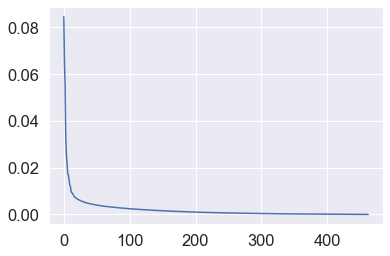

In [101]:
#Plotting the graph for svd components considering the explained variance ratio
plt.plot(svd.explained_variance_ratio_)
plt.show()

Upon seeing the above plot we consider the components 100 as it is approaching towards 0 after that and elbow is clearly forming around 100.

In [102]:
##Fitting the model by considering 100 components
svd = TruncatedSVD(random_state=4, n_components=100)
svd.fit(movie_rating_pivot)

TruncatedSVD(n_components=100, random_state=4)

In [103]:
movie_rating_svd = svd.fit_transform(movie_rating_pivot)

In [104]:
movie_rating_svd.shape  ##Shape of the dataframe after svd

(463, 100)

In [105]:
##by using corrcoef finding out the which movies are highly correlated with each other
corr = np.corrcoef(movie_rating_svd)
corr.shape

(463, 463)

In [106]:
corr ##Correlation values

array([[1.        , 0.27303748, 0.26871138, ..., 0.33481827, 0.39505083,
        0.28774971],
       [0.27303748, 1.        , 0.52690465, ..., 0.2146608 , 0.24906301,
        0.35507898],
       [0.26871138, 0.52690465, 1.        , ..., 0.37015714, 0.18672931,
        0.45282775],
       ...,
       [0.33481827, 0.2146608 , 0.37015714, ..., 1.        , 0.24869832,
        0.33669392],
       [0.39505083, 0.24906301, 0.18672931, ..., 0.24869832, 1.        ,
        0.350383  ],
       [0.28774971, 0.35507898, 0.45282775, ..., 0.33669392, 0.350383  ,
        1.        ]])

In [107]:
##Listing out the movie titles into the movie_list
movie_title = movie_rating_pivot.index
movie_list = list(movie_title)
##Considering any one movie here for example 'Alien'
movie_Alien = movie_list.index('Alien')
movie_Alien

17

In [108]:
corr_movie_Alien= corr[movie_Alien] ##Finding out all movies which are correlated with 'Alien'

In [109]:
movie_title[(corr_movie_Alien)>0.6] ##Taking the correlation cutoff to be greater than 0.6

Index(['2001: A Space Odyssey', 'Abyss, The', 'Alien', 'Aliens',
       'Alien³ (a.k.a. Alien 3)', 'Back to the Future', 'Blade Runner',
       'Die Hard', 'E.T. the Extra-Terrestrial', 'Fly, The',
       'Full Metal Jacket', 'Jaws', 'Men in Black (a.k.a. MIB)',
       'Planet of the Apes', 'Platoon', 'Predator',
       'Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark)',
       'Raising Arizona', 'RoboCop',
       'Star Wars: Episode V - The Empire Strikes Back', 'Terminator, The',
       'Total Recall'],
      dtype='object', name='title')

The above are few movies which are highly correlated with the movie 'Alien'.Similarly we can recommend for any movie considering the correlation.

### 7.2 Model Based - Surprise <a id='model'></a>

Within recommendation systems, there is a group of models called collaborative-filtering, which tries to find similarities between users or between items based on recorded user-item preferences or ratings.
This also predictes the ratings for the user for all the items.

In [110]:
#Considering the movie rating count to be greater than or equal to 15
movie_rating_count2 = movie_rating_count[movie_rating_count['MovieRatingCount']>=15]
##Removing duplicates based on the userid and title
movie_rating_count2 = movie_rating_count2.drop_duplicates(subset=['userId', 'title'])

In [111]:
movie_rating_count.rating.value_counts() ##The range of rating.

4.000000    28673
3.000000    19994
5.000000    15061
3.500000    10489
4.500000     7708
2.000000     7250
2.500000     4414
1.000000     3314
1.500000     1679
0.500000     1096
Name: rating, dtype: int64

In [112]:
##The Reader class is used to parse a file containing ratings.It orders the data in format of (userid,title,rating) and even by
##considering the rating scale
reader = Reader(rating_scale=(0.5,5.0))
data = Dataset.load_from_df(movie_rating_count2[['userId', 'title', 'rating']], reader)

In [113]:
svd = SVD()
cross_validate(svd, data, measures=['rmse'], cv=3, return_train_measures=True)
##The dataset is divided into train and test and with 3 folds the rmse has been calculated

{'test_rmse': array([0.87479239, 0.88107715, 0.8747685 ]),
 'train_rmse': array([0.65035691, 0.64894562, 0.65281158]),
 'fit_time': (4.3292999267578125, 4.3287975788116455, 4.471592903137207),
 'test_time': (0.40804553031921387, 0.28371286392211914, 0.20348286628723145)}

In [114]:
trainset = data.build_full_trainset()
svd.fit(trainset) ##Fitting the trainset with the help of svd

In [115]:
#Storing all the movie titles in items
items = movie_rating_count2['title'].unique()
##Considering the user '662' 
test = [[662, iid, 4] for iid in items]
##Finding the user predictions(ratings) for all the movies
predictions = svd.test(test)
pred = pd.DataFrame(predictions)

In [116]:
a=pred.sort_values(by='est', ascending=False) ##Sorting the values based on the estimated predictions

In [117]:
a[0:10] ##TOP 10

,uid,iid,r_ui,est,details
223,662,Schindler's List,4,4.599924,{'was_impossible': False}
1070,662,Modern Times,4,4.588696,{'was_impossible': False}
416,662,Cinema Paradiso (Nuovo cinema Paradiso),4,4.498600,{'was_impossible': False}
145,662,"Shawshank Redemption, The",4,4.419906,{'was_impossible': False}
1063,662,Double Indemnity,4,4.404034,{'was_impossible': False}
787,662,Happiness,4,4.389114,{'was_impossible': False}
326,662,Sunset Blvd. (a.k.a. Sunset Boulevard),4,4.376609,{'was_impossible': False}
446,662,Ran,4,4.375184,{'was_impossible': False}
308,662,"Philadelphia Story, The",4,4.371045,{'was_impossible': False}
348,662,"African Queen, The",4,4.369895,{'was_impossible': False}


## 7.3 Hybrid Based <a id='hybrid'></a>

Hybrid recommender systems combine two or more recommendation strategies in different ways to benefit from their complementary advantages.This is a combination of both content and collaborative based filtering methods.

In [118]:
simil.head()

title,Toy Story,Jumanji,Grumpier Old Men,Waiting to Exhale,Father of the Bride Part II,Heat,Sabrina,Tom and Huck,Sudden Death,GoldenEye,"American President, The",Dracula: Dead and Loving It,Balto,Nixon,Cutthroat Island,Casino,Sense and Sensibility,Four Rooms,Ace Ventura: When Nature Calls,Money Train,Get Shorty,Copycat,Assassins,Powder,Leaving Las Vegas,Othello,Now and Then,Persuasion,"City of Lost Children, The (Cité des enfants perdus, La)",Shanghai Triad (Yao a yao yao dao waipo qiao),Dangerous Minds,Twelve Monkeys (a.k.a. 12 Monkeys),Babe,Carrington,Dead Man Walking,Across the Sea of Time,It Takes Two,Clueless,"Cry, the Beloved Country",Richard III,Dead Presidents,Restoration,Mortal Kombat,To Die For,How to Make an American Quilt,Seven (a.k.a. Se7en),Pocahontas,When Night Is Falling,"Usual Suspects, The",Mighty Aphrodite,Lamerica,"Big Green, The",Georgia,Home for the Holidays,"Postman, The (Postino, Il)","Confessional, The (Confessionnal, Le)","Indian in the Cupboard, The",Eye for an Eye,Mr. Holland's Opus,Don't Be a Menace to South Central While Drinking Your Juice in the Hood,Two if by Sea,Bio-Dome,Lawnmower Man 2: Beyond Cyberspace,French Twist (Gazon maudit),Friday,From Dusk Till Dawn,Fair Game,Kicking and Screaming,"Misérables, Les",Bed of Roses,Screamers,Nico Icon,"Crossing Guard, The","Juror, The","White Balloon, The (Badkonake sefid)",Things to Do in Denver When You're Dead,Antonia's Line (Antonia),Once Upon a Time... When We Were Colored,Last Summer in the Hamptons,Angels and Insects,White Squall,Dunston Checks In,Black Sheep,Nick of Time,Mary Reilly,Vampire in Brooklyn,Beautiful Girls,Broken Arrow,In the Bleak Midwinter,"Hate (Haine, La)",Shopping,Heidi Fleiss: Hollywood Madam,City Hall,Bottle Rocket,Mr. Wrong,Unforgettable,Happy Gilmore,"Bridges of Madison County, The",Muppet Treasure Island,Catwalk,Braveheart,Taxi Driver,Rumble in the Bronx (Hont faan kui),Before and After,Margaret's Museum,Anne Frank Remembered,"Young Poisoner's Handbook, The",If Lucy Fell,"Steal Big, Steal Little","Boys of St. Vincent, The",Boomerang,Chungking Express (Chung Hing sam lam),"Star Maker, The (Uomo delle stelle, L')",Flirting With Disaster,"NeverEnding Story III, The",Pie in the Sky,Angela,Frankie Starlight,Jade,Down Periscope,Man of the Year,Up Close and Personal,"Birdcage, The","Brothers McMullen, The",Bad Boys,"Amazing Panda Adventure, The","Basketball Diaries, The","Awfully Big Adventure, An",Amateur,Apollo 13,Rob Roy,"Addiction, The",Batman Forever,Beauty of the Day (Belle de jour),Beyond Rangoon,Blue in the Face,Canadian Bacon,Casper,Clockers,Congo,Crimson Tide,Crumb,Desperado,Devil in a Blue Dress,Die Hard: With a Vengeance,"Doom Generation, The",Feast of July,First Knight,Free Willy 2: The Adventure Home,Hackers,Jeffrey,Johnny Mnemonic,Judge Dredd,Jury Duty,Kids,Living in Oblivion,Lord of Illusions,Love & Human Remains,Mad Love,Mallrats,Mighty Morphin Power Rangers: The Movie,Mute Witness,Nadja,"Net, The",Nine Months,Party Girl,"Prophecy, The",Reckless,Safe,"Scarlet Letter, The",Showgirls,Smoke,Something to Talk About,Species,Strange Days,"Umbrellas of Cherbourg, The (Parapluies de Cherbourg, Les)","Tie That Binds, The",Three Wishes,Total Eclipse,"To Wong Foo, Thanks for Everything! Julie Newmar",Under Siege 2: Dark Territory,Unstrung Heroes,Unzipped,"Walk in the Clouds, A",Waterworld,White Man's Burden,"Browning Version, The",Burnt by the Sun (Utomlyonnye solntsem),Before the Rain (Pred dozhdot),Before Sunrise,Billy Madison,"Babysitter, The",Boys on the Side,"Cure, The",Castle Freak,Circle of Friends,Clerks,Don Juan DeMarco,Disclosure,Drop Zone,Destiny Turns on the Radio,Death and the Maiden,Dolores Claiborne,Dumb & Dumber (Dumb and Dumber),Eat Drink Man Woman (Yin shi nan nu),Exotica,Exit to Eden,Ed Wood,French Kiss,Forget Paris,Far From Home: The Adventures of Yellow Dog,"Goofy Movie, A",Hideaway,Fluke,Farinelli: il castrato,Gordy,Gumby: The Movie,The Glass Shield,Hoop Dreams,Heavenly Creatures,Houseguest,Immortal Belo

In [119]:
simil.shape

(9027, 9028)

In [120]:
movie_rating.head()

,movieId,title,genres,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year,userId,rating
0,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,7,3.000000
1,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,9,4.000000
2,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,13,5.000000
3,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,15,2.000000
4,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,19,3.000000


Short list items based on similrity of content. Apply CF on the shortlisted items.

In [121]:
md2 = movie_rating[['movieId', 'title']] 

In [122]:
md2.shape

(99678, 2)

In [123]:
md2.drop_duplicates(inplace=True)

In [124]:
#here we have considered the content based to filter based on the similar titles and collaborative for the user.
def hybrid_rec(ttl, userid):
    idx = simil[simil['title']==ttl]
    idx = idx.drop('title', axis=1).T
    idx.columns = ['values']
    idx['movieId'] = simil.index
    idx = idx.sort_values(by='values', ascending=False).head(25)
 
    items = idx['movieId'].unique()
    test = [[userid, iid, 4] for iid in items]
    predictions = svd.test(test)
    pred = pd.DataFrame(predictions)
    pred = pred.merge(md2, left_on='iid', right_on='movieId')
    pred = pred.sort_values(by='est', ascending=False)
    return pred

In [125]:
hybrid_rec('I Am Legend',5) ##passing the movie name and user id

,uid,iid,r_ui,est,details,movieId,title
0,5,80363,4,3.876278,{'was_impossible': False},80363,Resident Evil: Afterlife
13,5,1320,4,3.876278,{'was_impossible': False},1320,Alien³ (a.k.a. Alien 3)
23,5,54995,4,3.876278,{'was_impossible': False},54995,Planet Terror
22,5,2525,4,3.876278,{'was_impossible': False},2525,Alligator
21,5,56801,4,3.876278,{'was_impossible': False},56801,AVPR: Aliens vs. Predator - Requiem
20,5,37380,4,3.876278,{'was_impossible': False},37380,Doom
19,5,158956,4,3.876278,{'was_impossible': False},158956,Kill Command
18,5,88879,4,3.876278,{'was_impossible': False},88879,Gantz
17,5,1762,4,3.876278,{'was_impossible': False},1762,Deep Rising
16,5,6502,4,3.876278,{'was_impossible': False},6502,28 Days Later


The above data recomends the movie for the particular user.This also estimates the user ratings for each of the movie.

## 7.4 Popularity Based <a id='pop'></a>

It is a type of recommendation system which works on the principle of popularity and or anything which is in trend.

In [126]:
total_rating_count=movie_rating.groupby(['movieId','genres']).count()['rating'].reset_index()
##Calculating the total rating count for movie based on movie and genre.

In [127]:
movie_df=pd.merge(movie_rating,total_rating_count,how='left',on='movieId') ##merging with the main dataset

In [128]:
movie_df.head()

,movieId,title,genres_x,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year,userId,rating_x,genres_y,rating_y
0,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,7,3.000000,"Adventure,Animation,Children,Comedy,Fantasy",247
1,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,9,4.000000,"Adventure,Animation,Children,Comedy,Fantasy",247
2,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,13,5.000000,"Adventure,Animation,Children,Comedy,Fantasy",247
3,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,15,2.000000,"Adventure,Animation,Children,Comedy,Fantasy",247
4,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,19,3.000000,"Adventure,Animation,Children,Comedy,Fantasy",247


In [129]:
movie_df.drop('genres_y',axis=1,inplace=True) #Dropping the duplicated columns
##Renaming the duplicated columns
movie_df.rename(columns={'genres_x':'genres','rating_y':'total_rating_count','rating_x':'user_rating'},inplace=True)

In [130]:
avg_rating=movie_rating.groupby(['movieId','genres']).mean()['rating'].reset_index() 
##Calculating the average rating for each movie based on the each movie and genre.

In [131]:
movie_df=pd.merge(movie_df,avg_rating,how='left',on='movieId') ##merging with the main the dataset
movie_df.drop('genres_y',axis=1,inplace=True) ##dropping the duplicated columns
movie_df.rename(columns={'genres_x':'genres','rating':'avg_rating'},inplace=True) #Renaming the columns

In [132]:
movie_df.head()

,movieId,title,genres,(no genres listed),Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year,userId,user_rating,total_rating_count,avg_rating
0,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,7,3.000000,247,3.872470
1,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,9,4.000000,247,3.872470
2,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,13,5.000000,247,3.872470
3,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,15,2.000000,247,3.872470
4,1,Toy Story,"Adventure,Animation,Children,Comedy,Fantasy",0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1995,19,3.000000,247,3.872470


In [133]:
mov=movie_df[['movieId','title','genres','total_rating_count','avg_rating']].copy()
mov.drop_duplicates(subset=['title'],inplace=True) ##dropping the duplicates based on the title
mov.reset_index(inplace=True,drop=True) #reseting the index

In [ ]:
mov.shape

In [ ]:
##Mean average rating across all the movies
C= mov['avg_rating'].mean()
C

In [ ]:
#movies having total count greater than 85%
m= mov['total_rating_count'].quantile(0.85) 
m

In [ ]:
#movies having vote count greater than 85% from the list will be taken
lists_movies = mov.copy().loc[mov['total_rating_count'] >= m]
lists_movies.shape

In [ ]:
def weighted_rating(x, m=m, C=C):
    v = x['total_rating_count']
    R = x['avg_rating']
    # Calculation based on the formula (m=19.0, c=3.293)
    return (v/(v+m) * R) + (m/(m+v) * C)

In [ ]:
# Define a new feature 'score' and calculate its value with `weighted_rating()`
lists_movies['score'] = lists_movies.apply(weighted_rating, axis=1)

In [ ]:
lists_movies.head(3)

In [ ]:
#Sort movies based on score calculated above
lists_movies = lists_movies.sort_values('score', ascending=False)

#Print the top 10 movies
lists_movies[['title', 'total_rating_count', 'avg_rating', 'score']].head(10)

In [ ]:
plt.figure(figsize=(12,4))
plt.barh(lists_movies['title'].head(10),lists_movies['score'].head(10), align='center',color='black')
plt.gca().invert_yaxis()
plt.xlabel("Popularity score")
plt.title("Popular Movies" )

The above plot shows the movies that can be recommended based on the popularity and trend.

## 7.5 Association Analysis <a id='Asso'></a>

Association analysis enables you to identify items that have an affinity for each other. It is frequently used to analyze transactional data (also called market baskets) to identify items that often appear together in transactions.Association analysis is also used for identifying dependent or associated events.

In [ ]:
movie_rating1=movie_rating.copy()
movie_rating1=movie_rating.iloc[:,3:23]
#Considering the genres for the association analysis
movie_rating1.head()

In [ ]:
freq_items = apriori(movie_rating1,min_support=0.05,use_colnames=True)
##The Apriori algorithm uses frequent itemsets to generate association rules, and it is designed to work on the databases that contain transactions.

In [ ]:
freq_items

In [ ]:
df_ar = association_rules(freq_items,metric='lift',min_threshold = 1.00)
##Association rules are "if-then" statements, that help to show the probability of relationships between data items
##Sorting the values based on the lift.
df_ar = df_ar.sort_values(by='lift',ascending = False)
df_ar.head(15)

1. The rule (Mystery) -> (Thriller), has the highest lift. In terms of support however, it was merely 5.4%.

2. The rule (Sci-Fi) -> (Action, Adventure) has the second highest lift, but the support remains almost equal 5.2%.

## 8. Conclusion <a id='conclu'></a>

1)We cannot recommend the movies always based on collaborative filtering because that does not perform well in cold-start scenarios (where little data is available on new users and new items) remains a challenge and performs poorly.

2)The content based filtering is not always prefered as this does not consider the user activity to recommend the items.

3)The popularity based filtering always recommend the items that are on trend irrespective of user choices.

4)Hybrid recommender systems usually show higher accuracy than Collaborative Filtering or Content-based Models.They are capable to address the cold-start problem better since if you don’t have any ratings for a user or an item you could use the metadata from the user or item to make a prediction.

So,Hybrid recommendation system would be best to recommend when compared to other recommended systems.

## 9. References <a id='Refer'></a>

http://www.tjprc.org/publishpapers/2-45-1368509642-20.%20Movie%20Ranking%20using%20-full.pdf

https://sci-hub.se/https://ieeexplore.ieee.org/document/8663822

https://scihub.se/https://www.researchgate.net/publication/319487277_Design_and_Implementation_of_Movie_Recommendation_System_based_on_Knn_Collaborative_Filtering_Algorithm

http://www.riejournal.com/article_106395_c6c0038f1bf5d4c421bd552d0541d6be.pdf

https://www.irjet.net/archives/V7/i7/IRJET-V7I7199.pdf

https://blog.cambridgespark.com/nowadays-recommender-systems-are-used-to-personalize-your-experience-on-the-web-telling-you-what-120f39b89c3c


<table align="center" width=125%>
    <tr>
        <td width="25%">
            <img src="movie.gif">
        </td>
        <td>
            <div align="center">
                <font color="#7F0542 ";size=50px>
                    <b>Thank You!
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>